## EDA 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import os
import gc
from scipy import stats
import FRUFS as fr

In [2]:
df = pd.read_csv('data.csv',sep=',')

In [3]:
df.head()

,id,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,...,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
0,0,-0.389420,-0.912791,0.648951,0.589045,-0.830817,0.733624,2.258560,2,13,...,-0.478412,-0.757002,-0.763635,-1.090369,1.142641,-0.884274,1.137896,1.309073,1.463002,0.813527
1,1,-0.689249,-0.453954,0.654175,0.995248,-1.653020,0.863810,-0.090651,2,3,...,-0.428791,-0.089908,-1.784204,-0.839474,0.459685,1.759412,-0.275422,-0.852168,0.562457,-2.680541
2,2,0.809079,0.324568,-1.170602,-0.624491,0.105448,0.783948,1.988301,5,11,...,-0.413534,-1.602377,1.190984,3.267116,-0.088322,-2.168635,-0.974989,1.335763,-1.110655,-3.630723
3,3,-0.500923,0.229049,0.264109,0.231520,0.415012,-1.221269,0.138850,6,2,...,0.619283,1.287801,0.532837,1.036631,-2.041828,1.440490,-1.900191,-0.630771,-0.050641,0.238333
4,4,-0.671268,-1.039533,-0.270155,-1.830264,-0.290108,-1.852809,0.781898,8,7,...,-1.628830,-0.434948,0.322505,0.284326,-2.438365,1.473930,-1.044684,1.602686,-0.405263,-1.987263


Info: Dataframe woth 30 columns (1 column is id)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98000 entries, 0 to 97999
Data columns (total 30 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      98000 non-null  int64  
 1   f_00    98000 non-null  float64
 2   f_01    98000 non-null  float64
 3   f_02    98000 non-null  float64
 4   f_03    98000 non-null  float64
 5   f_04    98000 non-null  float64
 6   f_05    98000 non-null  float64
 7   f_06    98000 non-null  float64
 8   f_07    98000 non-null  int64  
 9   f_08    98000 non-null  int64  
 10  f_09    98000 non-null  int64  
 11  f_10    98000 non-null  int64  
 12  f_11    98000 non-null  int64  
 13  f_12    98000 non-null  int64  
 14  f_13    98000 non-null  int64  
 15  f_14    98000 non-null  float64
 16  f_15    98000 non-null  float64
 17  f_16    98000 non-null  float64
 18  f_17    98000 non-null  float64
 19  f_18    98000 non-null  float64
 20  f_19    98000 non-null  float64
 21  f_20    98000 non-null  float64
 22

### Data Cleaning


In [5]:
df.isna().sum()

id      0
f_00    0
f_01    0
f_02    0
f_03    0
f_04    0
f_05    0
f_06    0
f_07    0
f_08    0
f_09    0
f_10    0
f_11    0
f_12    0
f_13    0
f_14    0
f_15    0
f_16    0
f_17    0
f_18    0
f_19    0
f_20    0
f_21    0
f_22    0
f_23    0
f_24    0
f_25    0
f_26    0
f_27    0
f_28    0
dtype: int64

In [6]:
df.duplicated().unique()

array([False])

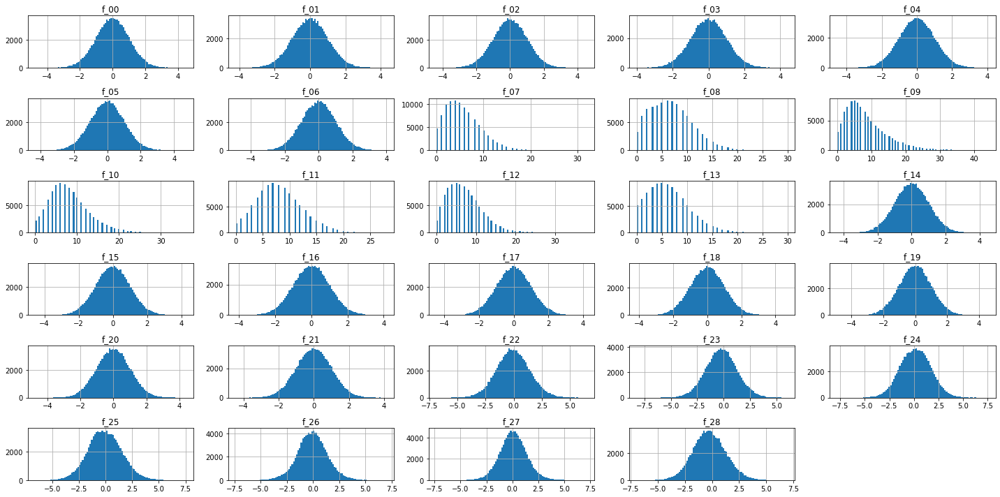

In [7]:
df.iloc[:,1:].hist(figsize=(20,10),bins=100)
plt.tight_layout()

In [8]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', df.shape[0])

corr = df.dropna().corr('pearson')
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

C:\Users\dj_ni\AppData\Local\Temp\ipykernel_20188\2686822064.py:5: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap='coolwarm').set_precision(2)


,id,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,f_09,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
id,1.00,0.00,-0.01,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00
f_00,0.00,1.00,-0.00,0.00,0.00,0.01,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.01,-0.00,0.01,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.01,0.00,0.00,0.00
f_01,-0.01,-0.00,1.00,0.00,-0.00,-0.00,-0.00,0.00,0.01,0.00,0.00,0.00,-0.00,-0.01,-0.01,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.01,0.00,-0.00,0.00,-0.01
f_02,0.00,0.00,0.00,1.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.01,-0.00,-0.00,0.01,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00
f_03,0.00,0.00,-0.00,-0.00,1.00,0.00,0.01,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.01,0.01,0.00,0.00,-0.00,0.00,0.00,0.00,0.00
f_04,-0.00,0.01,-0.00,-0.00,0.00,1.00,0.00,0.00,0.01,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00
f_05,-0.00,0.00,-0.00,-0.00,0.01,0.00,1.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.01,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00
f_06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,-0.00,-0.01,0.01,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.01,-0.01,0.00,-0.00,0.00,-0.00,-0.00,-0.01,-0.00,-0.01,-0.00
f_07,-0.00,-0.00,0.01,0.00,-0.00,0.01,0.00,-0.00,1.00,-0.13,0.04,-0.11,-0.01,-0.20,-0.12,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.09,0.03,0.09,-0.02,-0.02,-0.02
f_08,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.01,-0.13,1.00,-0.36,-0.05,0.18,-0.08,-0.01,0.00,0.00,-0.01,-0.00,-0.00,0.00,-0.00,-0.00,0.07,0.03,0.01,0.07,0.09,-0.02,-0.03


Categorical Features

In [9]:
df.iloc[:,7:15].head()

,f_06,f_07,f_08,f_09,f_10,f_11,f_12,f_13
0,2.258560,2,13,14,5,13,6,6
1,-0.090651,2,3,6,4,6,16,9
2,1.988301,5,11,5,8,9,3,11
3,0.138850,6,2,13,8,9,6,4
4,0.781898,8,7,5,3,1,13,11


count    98000.000000
mean         6.286102
std          4.120077
min          0.000000
25%          3.000000
50%          6.000000
75%          9.000000
max         30.000000
Name: f_13, dtype: float64
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 30]
30


c:\Users\dj_ni\anaconda3\envs\nikos_core_py39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


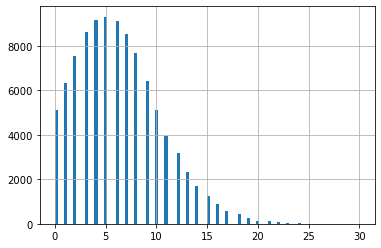

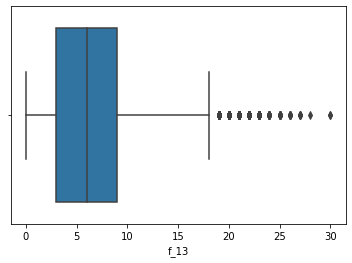

In [10]:
n_feat = 14 
 
df.iloc[:,n_feat].hist(bins=100)
plt.figure()
sns.boxplot(df.iloc[:,n_feat])
print(df.iloc[:,n_feat].describe())
print(df.iloc[:,n_feat].sort_values().unique())
print(df.iloc[:,n_feat].nunique())

Text(0.5, 1.0, 'f_13')

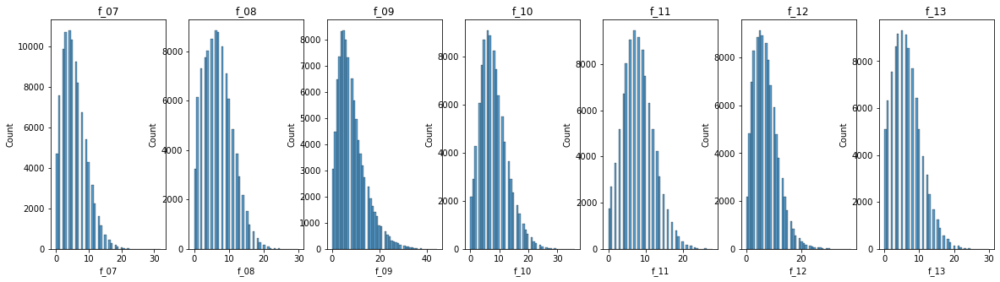

In [11]:
from matplotlib.pyplot import title


fig, ax = plt.subplots(1,7,figsize=(20,5))

sns.histplot(df.iloc[:,8],bins=50,ax=ax[0])
ax[0].set_title(df.columns[8])
sns.histplot(df.iloc[:,9],bins=50,ax=ax[1])
ax[1].set_title(df.columns[9])
sns.histplot(df.iloc[:,10],bins=50,ax=ax[2])
ax[2].set_title(df.columns[10])
sns.histplot(df.iloc[:,11],bins=50,ax=ax[3])
ax[3].set_title(df.columns[11])
sns.histplot(df.iloc[:,12],bins=50,ax=ax[4])
ax[4].set_title(df.columns[12])
sns.histplot(df.iloc[:,13],bins=50,ax=ax[5])
ax[5].set_title(df.columns[13])
sns.histplot(df.iloc[:,14],bins=50,ax=ax[6])
ax[6].set_title(df.columns[14])

Text(0.5, 1.0, 'f_13')

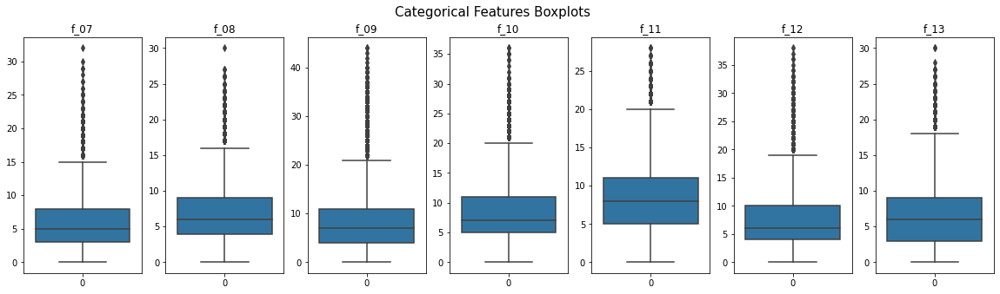

In [12]:
fig, ax = plt.subplots(1,7,figsize=(20,5),)


fig.suptitle(t='Categorical Features Boxplots',size=15)

sns.boxplot(data=df.iloc[:,8],ax=ax[0])
ax[0].set_title(df.columns[8])
sns.boxplot(data=df.iloc[:,9],ax=ax[1])
ax[1].set_title(df.columns[9])
sns.boxplot(data=df.iloc[:,10],ax=ax[2])
ax[2].set_title(df.columns[10])
sns.boxplot(data=df.iloc[:,11],ax=ax[3])
ax[3].set_title(df.columns[11])
sns.boxplot(data=df.iloc[:,12],ax=ax[4])
ax[4].set_title(df.columns[12])
sns.boxplot(data=df.iloc[:,13],ax=ax[5])
ax[5].set_title(df.columns[13])
sns.boxplot(data=df.iloc[:,14],ax=ax[6])
ax[6].set_title(df.columns[14])

## NO Outlier Removal

Power Transformation of data

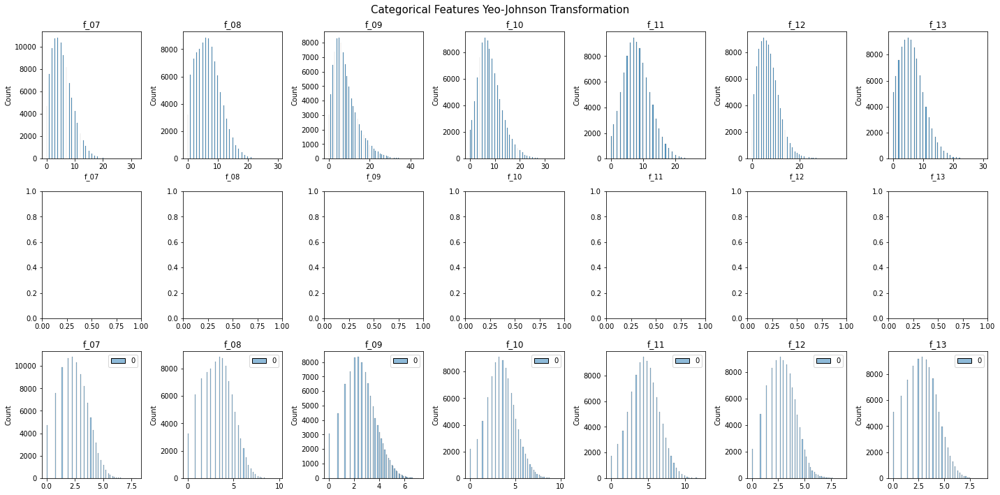

In [13]:
from sklearn.preprocessing import power_transform

fig, ax = plt.subplots(3,7,figsize=(20,10),)
fig.suptitle(t='Categorical Features Yeo-Johnson Transformation',size=15)

col_name = 8
sns.histplot(data=df.iloc[:,col_name],ax=ax[0,0])
ax[0,0].set_title(df.columns[col_name])
sns.histplot(power_transform(df.iloc[:,col_name].values.reshape(-1, 1), method='yeo-johnson',standardize=False),ax=ax[2,0])
ax[2,0].set_title(df.columns[col_name])

col_name = 9
sns.histplot(data=df.iloc[:,col_name],ax=ax[0,1])
ax[0,1].set_title(df.columns[col_name])
sns.histplot(power_transform(df.iloc[:,col_name].values.reshape(-1, 1), method='yeo-johnson',standardize=False),ax=ax[2,1])
ax[2,1].set_title(df.columns[col_name])

col_name = 10
sns.histplot(data=df.iloc[:,col_name],ax=ax[0,2])
ax[0,2].set_title(df.columns[col_name])
sns.histplot(power_transform(df.iloc[:,col_name].values.reshape(-1, 1), method='yeo-johnson',standardize=False),ax=ax[2,2])
ax[2,2].set_title(df.columns[col_name])

col_name = 11
sns.histplot(data=df.iloc[:,col_name],ax=ax[0,3])
ax[0,3].set_title(df.columns[col_name])
sns.histplot(power_transform(df.iloc[:,col_name].values.reshape(-1, 1), method='yeo-johnson',standardize=False),ax=ax[2,3])
ax[2,3].set_title(df.columns[col_name])

col_name = 12
sns.histplot(data=df.iloc[:,col_name],ax=ax[0,4])
ax[0,4].set_title(df.columns[col_name])
sns.histplot(power_transform(df.iloc[:,col_name].values.reshape(-1, 1), method='yeo-johnson',standardize=False),ax=ax[2,4])
ax[2,4].set_title(df.columns[col_name])

col_name = 13
sns.histplot(data=df.iloc[:,col_name],ax=ax[0,5])
ax[0,5].set_title(df.columns[col_name])
sns.histplot(power_transform(df.iloc[:,col_name].values.reshape(-1, 1), method='yeo-johnson',standardize=False),ax=ax[2,5])
ax[2,5].set_title(df.columns[col_name])

col_name = 14
sns.histplot(data=df.iloc[:,col_name],ax=ax[0,6])
ax[0,6].set_title(df.columns[col_name])
sns.histplot(power_transform(df.iloc[:,col_name].values.reshape(-1, 1), method='yeo-johnson',standardize=False),ax=ax[2,6])
ax[2,6].set_title(df.columns[col_name])

plt.tight_layout()

Final tranformations to Categorical + Continious features
- Power transformation (Yeo Johnson)

In [14]:
from sklearn.preprocessing import PowerTransformer
# for col_name in df.columns[1:]:
#     # power transformation
#     df.loc[:,col_name] = power_transform(df.loc[:,col_name].values.reshape(-1, 1), method='yeo-johnson',standardize=True)
df.iloc[:,1:] = pd.DataFrame(PowerTransformer().fit_transform(df.iloc[:,1:]))

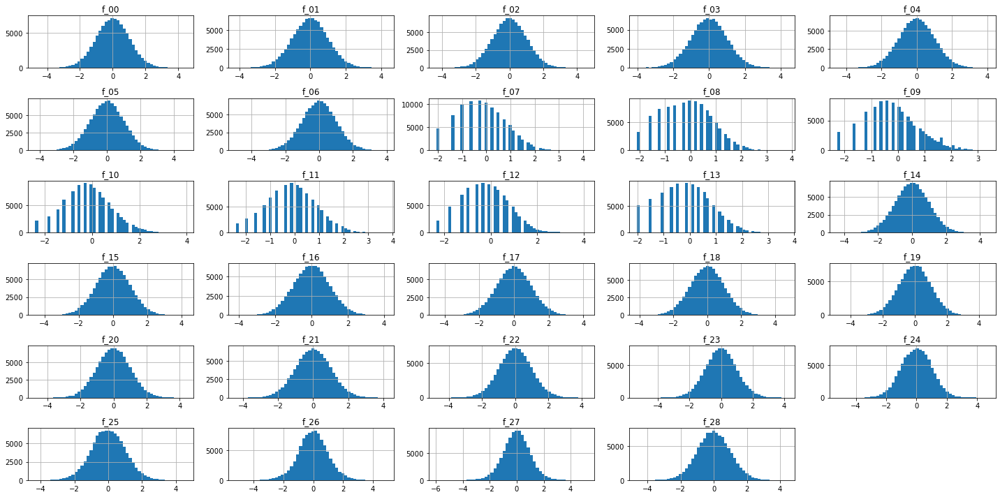

In [15]:
df.iloc[:,1:].hist(figsize=(20,10),bins=50)
plt.tight_layout()

NO Continious Variables Outlier Removal

In [16]:
df.loc[:,['f_00', 'f_01', 'f_02', 'f_03', 'f_04', 'f_05', 'f_06', 'f_14', 'f_15', 'f_16',
                            'f_17', 'f_18', 'f_19', 'f_20', 'f_21', 'f_22', 'f_23', 'f_24', 'f_25',
                            'f_26', 'f_27', 'f_28']].shape


(98000, 22)

In [17]:
df.describe()

,id,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,f_09,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
count,98000.000000,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04,9.800000e+04
mean,48999.500000,1.636106e-17,-2.359451e-17,-7.302549e-18,1.549781e-18,3.221204e-18,1.944250e-17,-3.536287e-17,4.432056e-16,3.075431e-16,2.182449e-16,4.445510e-16,-6.019811e-16,1.149702e-15,-1.091559e-16,-2.929686e-17,6.505001e-18,1.477503e-17,5.138718e-17,-1.651513e-17,8.156741e-19,-2.112822e-17,-1.142397e-17,-3.051980e-18,-3.297136e-17,-1.196549e-17,-4.380000e-18,1.744183e-17,1.742031e-17,6.456853e-18
std,28290.307527,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00
min,0.000000,-4.725789e+00,-4.213798e+00,-4.341712e+00,-4.030537e+00,-4.515072e+00,-4.291662e+00,-4.937801e+00,-2.070579e+00,-2.117927e+00,-2.272516e+00,-2.407641e+00,-2.398236e+00,-2.346865e+00,-2.025880e+00,-4.405844e+00,-4.536810e+00,-4.181602e+00,-4.477899e+00,-4.156415e+00,-4.846921e+00,-4.731373e+00,-4.403534e+00,-4.757347e+00,-5.344240e+00,-5.227565e+00,-4.322237e+00,-5.176218e+00,-5.973419e+00,-4.646507e+00
25%,24499.750000,-6.743761e-01,-6.757248e-01,-6.719176e-01,-6.705926e-01,-6.770434e-01,-6.733050e-01,-6.781042e-01,-5.981226e-01,-5.750189e-01,-6.351572e-01,-5.677748e-01,-6.828756e-01,-6.145896e-01,-7.353704e-01,-6.751720e-01,-6.740811e-01,-6.739409e-01,-6.729778e-01,-6.777720e-01,-6.720297e-01,-6.768122e-01,-6.749679e-01,-6.615408e-01,-6.582059e-01,-6.913232e-01,-6.687566e-01,-6.377111e-01,-6.403068e-01,-6.672694e-01
50%,48999.500000,1.196700e-03,1.811562e-03,-1.610195e-03,-4.001730e-04,-5.722443e-05,2.193779e-03,3.247989e-03,2.171834e-02,-4.885615e-02,1.398752e-02,-9.074918e-02,6.690546e-02,-8.359552e-02,8.607264e-02,1.799098e-03,-1.006074e-03,1.799516e-03,1.020805e-03,3.423709e-03,2.413138e-03,6.863349e-04,-2.597677e-04,-1.811785e-03,-4.719308e-04,4.909952e-03,-5.305024e-03,-2.157539e-03,1.949197e-03,-5.393793e-03
75%,73499.250000,6.743506e-01,6.720180e-01,6.761390e-01,6.734950e-01,6.789115e-01,6.743964e-01,6.739472e-01,7.568995e-01,6.221334e-01,6.532052e-01,7.069320e-01,7.316652e-01,7.557552e-01,7.384555e-01,6.767627e-01,6.760632e-01,6.736085e-01,6.711544e-01,6.749288e-01,6.730265e-01,6.744150e-01,6.775084e-01,6.606887e-01,6.581571e-01,6.829543e-01,6.756703e-01,6.361445e-01,6.406078e-01,6.669561e-01
max,97999.000000,4.471742e+00,4.307363e+00,4.585788e+00,4.372601e+00,4.044618e+00,4.715575e+00,3.988256e+00,4.167411e+00,3.829444e+00,3.375941e+00,3.968874e+00,3.745128e+00,4.134619e+00,3.738767e+00,4.470513e+00,4.261034e+00,4.131130e+00,4.212237e+00,4.740703e+00,4.564552e+00,4.374950e+00,4.169190e+00,4.317352e+00,4.210245e+00,4.713935e+00,4.610223e+00,4.896985e+00,5.214177e+00,4.443318e+00


In [18]:
df.isna().sum()

id      0
f_00    0
f_01    0
f_02    0
f_03    0
f_04    0
f_05    0
f_06    0
f_07    0
f_08    0
f_09    0
f_10    0
f_11    0
f_12    0
f_13    0
f_14    0
f_15    0
f_16    0
f_17    0
f_18    0
f_19    0
f_20    0
f_21    0
f_22    0
f_23    0
f_24    0
f_25    0
f_26    0
f_27    0
f_28    0
dtype: int64

In [19]:
original_shape = df.shape[0]
df = df.dropna(axis=0)
final_shape = df.shape[0]
(original_shape-final_shape)*100/original_shape

0.0

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

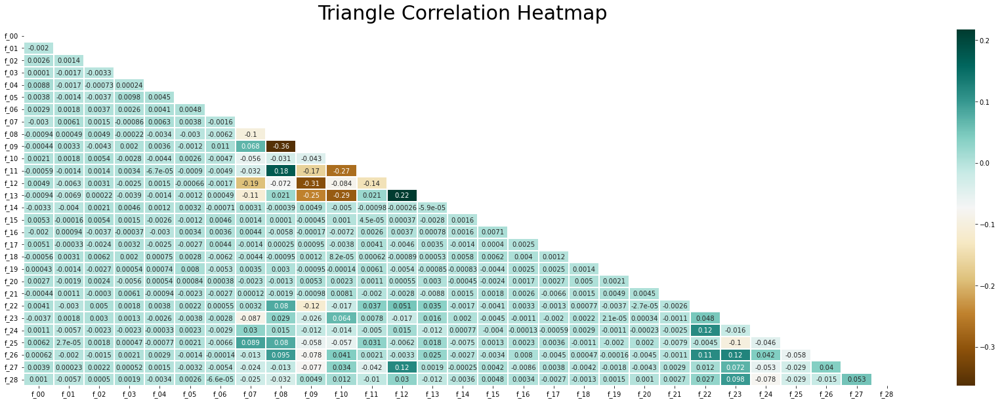

In [20]:
plt.figure(figsize=(30, 10))
# sns.set_style('white')
mask = np.triu(np.ones_like(df.iloc[:,1:].corr(), dtype=np.bool_))
heatmap = sns.heatmap(df.iloc[:,1:].corr(), mask=mask,annot=True, cmap='BrBG', linewidths = 2)
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':30}, pad=16)

In [71]:
# from scipy.stats import pearsonr

# def corrfunc(x, y, ax=None, **kws):
#     """Plot the correlation coefficient in the top left hand corner of a plot."""
#     r, _ = pearsonr(x, y)
#     ax = ax or plt.gca()
#     ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

# g = sns.pairplot(
#     pd.DataFrame(data=df.iloc[:,1:]).sample(frac=0.25),
#     # corner=True,
#     # kind='reg',
#     # plot_kws={
#     #     'line_kws':{'color':'olive'},
#     #     'scatter_kws': {'alpha': 0.2}})
# )
# # g.map_lower(corrfunc)
# g.set(xticklabels=[])
# g.set(yticklabels=[])
# g.fig.suptitle('Synthetic Features vs Each Other')

In [72]:
## after Power Transformation data there are no categorical data
df.head()

,id,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,f_09,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
0,0,-0.389420,-0.912791,0.648951,0.589045,-0.830817,0.733624,2.258560,1.396732,5.781099,4.195301,2.872084,6.978790,2.981224,3.233270,-0.469819,0.358126,1.068105,-0.559650,-0.366905,-0.478412,-0.757002,-0.763635,-1.090369,1.142641,-0.884274,1.137896,1.309073,1.463002,0.813527
1,1,-0.689249,-0.453954,0.654175,0.995248,-1.653020,0.863810,-0.090651,1.396732,2.051566,2.650316,2.451785,3.898026,5.364640,4.232028,0.591035,-0.396915,0.145834,-0.030798,0.471167,-0.428791,-0.089908,-1.784204,-0.839474,0.459685,1.759412,-0.275422,-0.852168,0.562457,-2.680541
2,2,0.809079,0.324568,-1.170602,-0.624491,0.105448,0.783948,1.988301,2.674721,5.177242,2.378872,3.953282,5.311084,1.868529,4.813183,-0.679875,0.469326,0.349843,-0.288042,0.291470,-0.413534,-1.602377,1.190984,3.267116,-0.088322,-2.168635,-0.974989,1.335763,-1.110655,-3.630723
3,3,-0.500923,0.229049,0.264109,0.231520,0.415012,-1.221269,0.138850,3.013270,1.493284,4.040311,3.953282,5.311084,2.981224,2.436732,-0.389456,0.626762,-1.074543,-1.521753,-1.150806,0.619283,1.287801,0.532837,1.036631,-2.041828,1.440490,-1.900191,-0.630771,-0.050641,0.238333
4,4,-0.671268,-1.039533,-0.270155,-1.830264,-0.290108,-1.852809,0.781898,3.614551,3.806630,2.378872,1.986035,0.874678,4.766396,4.813183,-0.120743,-0.615578,-1.064359,0.444142,0.428327,-1.628830,-0.434948,0.322505,0.284326,-2.438365,1.473930,-1.044684,1.602686,-0.405263,-1.987263


In [73]:
# ## convert from float to int32 (categorical variables)
# df.loc[:,['f_07', 'f_08', 'f_09', 'f_10', 'f_11', 'f_12', 'f_13']] = df.loc[:,['f_07', 'f_08', 'f_09', 'f_10', 'f_11', 'f_12', 'f_13']].astype('int32')
# df.info()

In [23]:
model_frufs_generated = fr.FRUFS(
        model_r = fr.LGBMRegressor(random_state=42),
        model_c = fr.LGBMClassifier(random_state=42),
        k=0.5,
        n_jobs=-1
    )
model_frufs_generated.fit(df.iloc[:,1:])

Progress bar: 100%|██████████| 29/29 [00:11<00:00,  2.46it/s]


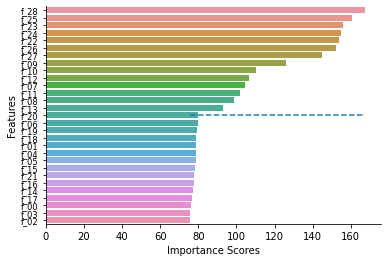

In [24]:
model_frufs_generated.feature_importance() # LGM model

In [26]:
# ### Keep only ['f_22', 'f_23', 'f_24', 'f_25' 'f_26', 'f_27', 'f_28'] important features

# df = df.loc[:,['f_22', 'f_23', 'f_24', 'f_25', 'f_26', 'f_27', 'f_28']]

Univariate Normality test

In [26]:
from scipy.stats import shapiro, kstest
from termcolor import colored

# Univariate normality test
for col in df.columns:
    features = []
    stat, p_value = kstest(rvs=df[col],cdf='norm',N=df.shape[0])
    # stat, p_value = shapiro(df[col])
    # print(p_value)
    alpha = 0.1    # significance level
    if p_value < alpha: 
        result = colored('Rejected', 'red')
    else:
        result = colored('Accepted','green')
#         features = features + "colname"
    print('Feature: {}\t Hypothesis: {}'.format(col, result))

Feature: id	 Hypothesis: Rejected
Feature: f_00	 Hypothesis: Accepted
Feature: f_01	 Hypothesis: Accepted
Feature: f_02	 Hypothesis: Accepted
Feature: f_03	 Hypothesis: Accepted
Feature: f_04	 Hypothesis: Accepted
Feature: f_05	 Hypothesis: Accepted
Feature: f_06	 Hypothesis: Accepted
Feature: f_07	 Hypothesis: Rejected
Feature: f_08	 Hypothesis: Rejected
Feature: f_09	 Hypothesis: Rejected
Feature: f_10	 Hypothesis: Rejected
Feature: f_11	 Hypothesis: Rejected
Feature: f_12	 Hypothesis: Rejected
Feature: f_13	 Hypothesis: Rejected
Feature: f_14	 Hypothesis: Accepted
Feature: f_15	 Hypothesis: Accepted
Feature: f_16	 Hypothesis: Rejected
Feature: f_17	 Hypothesis: Accepted
Feature: f_18	 Hypothesis: Accepted
Feature: f_19	 Hypothesis: Accepted
Feature: f_20	 Hypothesis: Accepted
Feature: f_21	 Hypothesis: Accepted
Feature: f_22	 Hypothesis: Rejected
Feature: f_23	 Hypothesis: Rejected
Feature: f_24	 Hypothesis: Rejected
Feature: f_25	 Hypothesis: Rejected
Feature: f_26	 Hypothesis: Rej

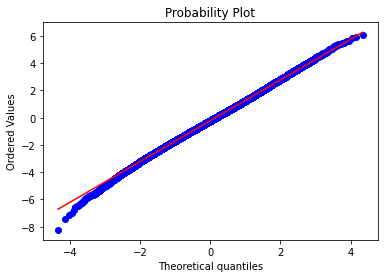

In [27]:
import scipy.stats as stats
stats.probplot(df['f_23'], dist="norm", plot=plt)
plt.show()

In [31]:
df.describe()

,id,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,f_09,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
count,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000,98000.000000
mean,48999.500000,0.001220,0.005580,-0.001042,-0.000700,-0.003522,-0.001612,-0.003042,2.646957,3.496972,2.878195,3.758397,4.727350,3.091337,3.101498,0.003413,-0.002639,0.005404,0.001656,-0.005399,-0.004513,-0.000515,-0.001670,-0.038752,-0.220002,0.166434,-0.064309,-0.062540,0.098472,-0.230910
std,28290.307527,1.002801,1.000742,1.001373,1.000422,1.003061,1.000532,0.997434,1.278372,1.651138,1.266530,1.561037,1.971188,1.317226,1.530946,0.998940,1.001096,1.003277,1.001258,0.995965,1.004372,1.002962,0.999703,1.477858,1.494836,1.543014,1.576086,1.428055,1.305407,1.528476
min,0.000000,-4.732235,-4.202795,-4.377021,-4.010826,-4.535903,-4.300767,-4.894525,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4.377021,-4.535903,-4.182233,-4.468930,-4.149688,-4.894525,-4.732235,-4.438130,-6.873999,-8.234305,-7.792363,-6.593842,-7.375719,-7.335556,-6.954151
25%,24499.750000,-0.675226,-0.670985,-0.672779,-0.672540,-0.682510,-0.675066,-0.680421,1.882337,2.547541,2.073753,2.872084,3.381280,2.281788,1.975691,-0.671810,-0.677757,-0.671055,-0.672635,-0.680243,-0.678773,-0.679777,-0.675147,-1.022964,-1.203204,-0.903385,-1.128966,-0.975680,-0.746489,-1.262606
50%,48999.500000,0.002022,0.006650,-0.000324,-0.003185,-0.003307,0.001024,-0.002053,2.674721,3.416304,2.895910,3.616735,4.859232,2.981224,3.233270,0.003536,-0.004299,0.006535,0.001663,-0.001574,-0.000587,-0.000806,0.000819,-0.056687,-0.219046,0.167074,-0.099221,-0.070852,0.082230,-0.271319
75%,73499.250000,0.677271,0.677746,0.677086,0.672097,0.677589,0.673344,0.668112,3.614551,4.524195,3.705494,4.861939,6.169592,4.086833,4.232028,0.678679,0.673859,0.680903,0.673174,0.666996,0.672149,0.675437,0.676881,0.930158,0.764690,1.217432,0.987684,0.843212,0.925306,0.770516
max,97999.000000,4.490521,4.324974,4.560247,4.399373,4.050549,4.710316,3.998595,7.974432,9.819882,7.153903,9.953925,12.109665,8.537539,8.825321,4.490521,4.270708,4.157538,4.230849,4.710316,4.560247,4.399373,4.135419,6.517721,6.054831,7.527271,7.544731,7.005608,7.205971,6.977150


In [30]:
# from scipy.stats import pearsonr

# def corrfunc(x, y, ax=None, **kws):
#     """Plot the correlation coefficient in the top left hand corner of a plot."""
#     r, _ = pearsonr(x, y)
#     ax = ax or plt.gca()
#     ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

# g = sns.pairplot(
#     pd.DataFrame(data=df.iloc[:,1:]).sample(frac=0.25),
#     # corner=True,
#     # kind='reg',
#     # plot_kws={
#     #     'line_kws':{'color':'olive'},
#     #     'scatter_kws': {'alpha': 0.2}})
# )
# # g.map_lower(corrfunc)
# g.set(xticklabels=[])
# g.set(yticklabels=[])
# g.fig.suptitle('Synthetic Features vs Each Other')

## Standarize data

In [24]:
# df = df.iloc[:,1:]

In [25]:
# from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
# scaler = StandardScaler()
# df_scaled = scaler.fit_transform(df)

In [26]:
# df_scaled = pd.DataFrame(df_scaled,columns=df.columns)

In [74]:
# df_scaled.hist(figsize=(20,10),bins=50)
# plt.tight_layout()

In [75]:
# plt.figure(figsize=(30, 10))
# # sns.set_style('white')
# mask = np.triu(np.ones_like(df_scaled.corr(), dtype=np.bool_))
# heatmap = sns.heatmap(df_scaled.corr(), mask=mask,annot=True, cmap='BrBG', linewidths = 2)
# heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':30}, pad=16)

## Quick Check with K-Means

In [19]:
df.columns

Index(['id', 'f_00', 'f_01', 'f_02', 'f_03', 'f_04', 'f_05', 'f_06', 'f_07',
       'f_08', 'f_09', 'f_10', 'f_11', 'f_12', 'f_13', 'f_14', 'f_15', 'f_16',
       'f_17', 'f_18', 'f_19', 'f_20', 'f_21', 'f_22', 'f_23', 'f_24', 'f_25',
       'f_26', 'f_27', 'f_28'],
      dtype='object')

In [20]:
from sklearn.cluster import KMeans
selected_features = ['f_07', 'f_08', 'f_09', 'f_10', 'f_11', 'f_12', 'f_13','f_22', 'f_23', 'f_24', 'f_25', 'f_26', 'f_27', 'f_28']

In [32]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from sklearn.metrics import silhouette_score
from tqdm import tqdm

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
shilouette_scores = {}
K = range(2, 10)
  
for k in tqdm(K):
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k, init='k-means++', random_state=42).fit(df_scaled[selected_features])
  
    distortions.append(sum(np.min(cdist(df_scaled[selected_features], kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / df_scaled.shape[0])
    inertias.append(kmeanModel.inertia_)
  
    mapping1[k] = sum(np.min(cdist(df_scaled[selected_features], kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / df_scaled.shape[0]
    mapping2[k] = kmeanModel.inertia_

    preds = kmeanModel.predict(df_scaled[selected_features])
    shilouette_scores[k] = silhouette_score(df_scaled[selected_features], preds, metric='euclidean', sample_size=None, random_state=None)

100%|██████████| 8/8 [22:30<00:00, 168.75s/it]


In [33]:
shilouette_scores

{2: 0.08256633398646863,
 3: 0.07541313048369057,
 4: 0.07635710017965883,
 5: 0.07597219421824934,
 6: 0.0748543795071629,
 7: 0.07201462986726664,
 8: 0.07190498980724826,
 9: 0.07182413906116687}

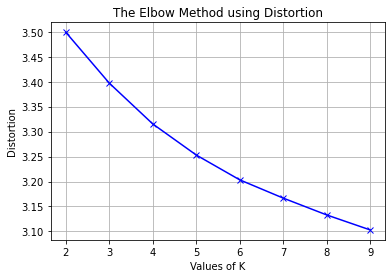

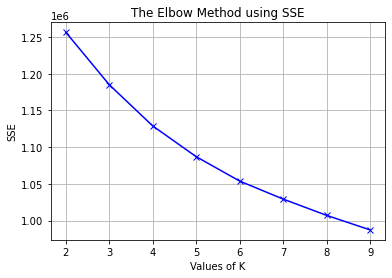

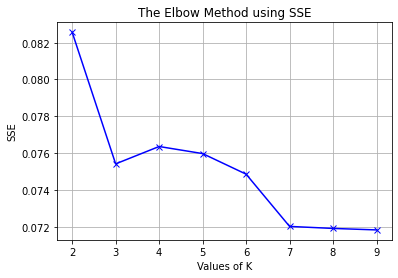

In [34]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.grid()
plt.show()

plt.figure()
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('SSE')
plt.title('The Elbow Method using SSE')
plt.grid()
plt.show()

plt.figure()
plt.plot(K, shilouette_scores.values(), 'bx-')
plt.xlabel('Values of K')
plt.ylabel('SSE')
plt.title('The Elbow Method using SSE')
plt.grid()
plt.show()

In [21]:
df.head()

,id,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,f_09,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
0,0,-0.389230,-0.917652,0.647948,0.590717,-0.824836,0.734685,2.259470,-0.977987,1.383372,1.039938,-0.567775,1.142180,-0.083596,0.086073,-0.472528,0.360917,1.059091,-0.559978,-0.363318,-0.472922,-0.753925,-0.763110,-0.707876,0.911477,-0.678852,0.768543,0.960344,1.042536,0.694234
1,1,-0.688368,-0.458647,0.653182,0.995359,-1.644030,0.864898,-0.085604,-0.977987,-0.875405,-0.179925,-0.837020,-0.420725,1.725834,0.738456,0.589229,-0.393323,0.140626,-0.031402,0.478200,-0.423594,-0.088164,-1.777545,-0.535582,0.453824,1.031505,-0.117686,-0.550783,0.367242,-1.636652
2,2,0.805709,0.319397,-1.166935,-0.622421,0.108371,0.785018,1.990489,0.021718,1.017648,-0.394246,0.124844,0.296135,-0.928325,1.118063,-0.683265,0.471924,0.343886,-0.288433,0.297704,-0.408425,-1.598612,1.194423,2.203065,0.086974,-1.519163,-0.568662,0.978900,-0.926277,-2.296373
3,3,-0.500469,0.223997,0.262677,0.234061,0.417047,-1.218768,0.144455,0.286548,-1.213526,0.917564,0.124844,0.296135,-0.083596,-0.434221,-0.391941,0.629061,-1.076596,-1.522832,-1.149882,0.620278,1.283827,0.532884,0.731623,-1.218086,0.826492,-1.173592,-0.395085,-0.100021,0.326682
4,4,-0.670427,-1.044482,-0.270854,-1.833338,-0.285955,-1.849243,0.787627,0.756900,0.187543,-0.394246,-1.135381,-1.954502,1.271662,1.118063,-0.122647,-0.611913,-1.066430,0.442699,0.435167,-1.614933,-0.432406,0.321899,0.228337,-1.482684,0.847999,-0.613935,1.164389,-0.374203,-1.160058


In [24]:
# kmeanModel = KMeans(n_clusters=7, random_state=0)
# preds = kmeanModel.fit_predict(df.iloc[:,1:])

from sklearn.mixture import BayesianGaussianMixture

cls_gaussian= BayesianGaussianMixture(n_components=7,tol=0.001,init_params='kmeans',n_init=5)
preds = cls_gaussian.fit_predict(df[selected_features])

In [25]:
np.unique(preds)

array([0, 1, 2, 3, 4, 5, 6], dtype=int64)

In [26]:
sub = pd.read_csv('sample_submission.csv')
sub['Predicted'] = preds
sub.to_csv('submission_final.csv',index=False)

In [53]:
## Best CLuster number with different initializations (random state)
import random
from sklearn.metrics import silhouette_score
from tqdm import tqdm

scores = []
randoms = random.sample(range(1000),10)
for r in tqdm(randoms):
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=7, init='k-means++', random_state=r).fit(df_scaled)
    preds = kmeanModel.predict(df_scaled)
    scores.append(silhouette_score(df_scaled,preds, metric='euclidean', sample_size=None, random_state=None))

print('Scores: ',scores)
print('<Score>: ',np.mean(scores))

100%|██████████| 10/10 [11:08<00:00, 66.83s/it]

Scores:  [0.03155517962675101, 0.03156531480740951, 0.03154717062294623, 0.03155881920286601, 0.0315621758233545, 0.0315710707738933, 0.03156918560499546, 0.031554513235266916, 0.03157830084138686, 0.03157650686273155]
<Score>:  0.03156382374016013


In [54]:
print('Best Score: ',randoms[np.argmax(scores)])

Best Score:  11


In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

n_clusters = 7
# Create a subplot with 1 row and 2 columns
fig, ax1 = plt.figure()
fig.set_size_inches(18, 7)

# The 1st subplot is the silhouette plot
# The silhouette coefficient can range from -1, 1 but in this example all
# lie within [-0.1, 1]
plt.set_xlim([-0.1, 1])
# The (n_clusters+1)*10 is for inserting blank space between silhouette
# plots of individual clusters, to demarcate them clearly.
plt.set_ylim([0, len(df_scaled) + (n_clusters + 1) * 10])

# Initialize the clusterer with n_clusters value and a random generator
# seed of 10 for reproducibility.
clusterer = KMeans(n_clusters=7, init='k-means++', random_state=r)
cluster_labels = clusterer.fit_predict(df_scaled)

# The silhouette_score gives the average value for all the samples.
# This gives a perspective into the density and separation of the formed
# clusters
silhouette_avg = silhouette_score(df_scaled, cluster_labels)
print(
    "For n_clusters =",
    n_clusters,
    "The average silhouette_score is :",
    silhouette_avg,
)

# Compute the silhouette scores for each sample
sample_silhouette_values = silhouette_samples(df_scaled, cluster_labels)

y_lower = 10
for i in range(n_clusters):
    # Aggregate the silhouette scores for samples belonging to
    # cluster i, and sort them
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / n_clusters)
    ax1.fill_betweenx(
        np.arange(y_lower, y_upper),
        0,
        ith_cluster_silhouette_values,
        facecolor=color,
        edgecolor=color,
        alpha=0.7,
    )

    # Label the silhouette plots with their cluster numbers at the middle
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    # Compute the new y_lower for next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

plt.set_title("The silhouette plot for the various clusters.")
plt.set_xlabel("The silhouette coefficient values")
plt.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
plt.axvline(x=silhouette_avg, color="red", linestyle="--")

plt.set_yticks([])  # Clear the yaxis labels / ticks
plt.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

In [ ]:
# kmeans = KMeans(n_clusters=7, init='k-means++', random_state=42).fit(df_scaled.iloc[:,:-1])

# preds = kmeans.predict(df_scaled.iloc[:,:-1].values)
# df_scaled['preds'] = preds
# df_scaled.head()


# plt.figure()
# sns.scatterplot(x=df_scaled['f_22'], y=df_scaled['f_23'] ,hue=df_scaled['preds'], palette="deep")
# plt.xlim(-5,5)
# plt.ylim(-5,5)

# ## shilouette score
# from sklearn.metrics import silhouette_score
# print(silhouette_score(df_scaled.iloc[:,:-1],df_scaled.iloc[:,-1], metric='euclidean', sample_size=None, random_state=None))

## DBSCAN

In [70]:
df.head()

,f_00,f_01,f_02,f_03,f_04,f_05,f_06,f_07,f_08,f_09,f_10,f_11,f_12,f_13,f_14,f_15,f_16,f_17,f_18,f_19,f_20,f_21,f_22,f_23,f_24,f_25,f_26,f_27,f_28
0,-0.389420,-0.912791,0.648951,0.589045,-0.830817,0.733624,2.258560,1.396732,5.781099,4.195301,2.872084,6.978790,2.981224,3.233270,-0.469819,0.358126,1.068105,-0.559650,-0.366905,-0.478412,-0.757002,-0.763635,-1.090369,1.142641,-0.884274,1.137896,1.309073,1.463002,0.813527
1,-0.689249,-0.453954,0.654175,0.995248,-1.653020,0.863810,-0.090651,1.396732,2.051566,2.650316,2.451785,3.898026,5.364640,4.232028,0.591035,-0.396915,0.145834,-0.030798,0.471167,-0.428791,-0.089908,-1.784204,-0.839474,0.459685,1.759412,-0.275422,-0.852168,0.562457,-2.680541
2,0.809079,0.324568,-1.170602,-0.624491,0.105448,0.783948,1.988301,2.674721,5.177242,2.378872,3.953282,5.311084,1.868529,4.813183,-0.679875,0.469326,0.349843,-0.288042,0.291470,-0.413534,-1.602377,1.190984,3.267116,-0.088322,-2.168635,-0.974989,1.335763,-1.110655,-3.630723
3,-0.500923,0.229049,0.264109,0.231520,0.415012,-1.221269,0.138850,3.013270,1.493284,4.040311,3.953282,5.311084,2.981224,2.436732,-0.389456,0.626762,-1.074543,-1.521753,-1.150806,0.619283,1.287801,0.532837,1.036631,-2.041828,1.440490,-1.900191,-0.630771,-0.050641,0.238333
4,-0.671268,-1.039533,-0.270155,-1.830264,-0.290108,-1.852809,0.781898,3.614551,3.806630,2.378872,1.986035,0.874678,4.766396,4.813183,-0.120743,-0.615578,-1.064359,0.444142,0.428327,-1.628830,-0.434948,0.322505,0.284326,-2.438365,1.473930,-1.044684,1.602686,-0.405263,-1.987263


In [67]:
import hdbscan

hdbscan = hdbscan.HDBSCAN(min_cluster_size=7, min_samples= 10)
preds = hdbscan.fit_predict(df_scaled.iloc[:,8:])

In [68]:
np.unique(preds)

array([-1,  0,  1], dtype=int64)

In [69]:
from sklearn.metrics import silhouette_score
silhouette_score(df_scaled, preds)

-0.19519087616457861

In [64]:
preds[np.where(preds!=-1)[0]] 

array([2, 2, 2, ..., 2, 2, 2], dtype=int64)

(-5.0, 5.0)

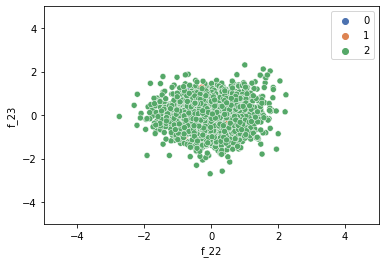

In [66]:
sns.scatterplot(x=df_scaled.loc[np.where(preds!=-1)[0],'f_22'], y=df_scaled.loc[np.where(preds!=-1)[0],'f_23'] , hue=preds[np.where(preds!=-1)[0]], palette="deep")
plt.xlim(-5,5)
plt.ylim(-5,5)

## Dimensionality Reduction

### PCA

In [43]:
from sklearn import decomposition
pca = decomposition.PCA(0.9)
df_scaled_transform = pca.fit_transform(df)
# df_scaled_transform = pca.fit_transform(df)

In [44]:
pca.explained_variance_ratio_

array([0.10107194, 0.07027488, 0.06816546, 0.05986801, 0.05658866,
       0.04895577, 0.04426079, 0.04244959, 0.04044112, 0.03703813,
       0.03564423, 0.03271728, 0.0295304 , 0.02158974, 0.02152099,
       0.0214869 , 0.02140313, 0.02134879, 0.0211893 , 0.02116742,
       0.02113262, 0.02111617, 0.02104036, 0.02098111])

Text(0.5, 1.0, 'Scaled data PCA')

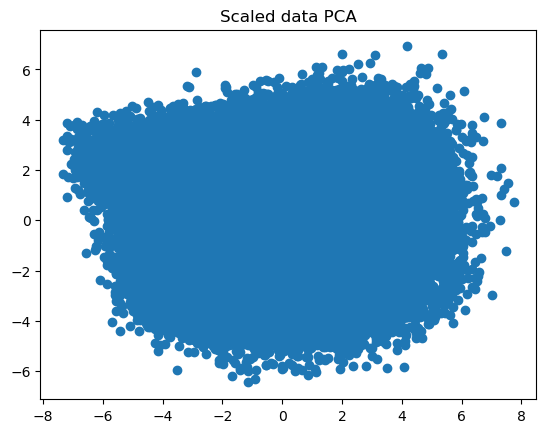

In [45]:
plt.scatter(df_scaled_transform[:,0],df_scaled_transform[:,1])
plt.title('Scaled data PCA')

### TSNE

In [50]:
from sklearn.manifold import TSNE 
import matplotlib.patheffects as pe

df_scaled_transform = TSNE(perplexity=30,n_jobs=-1).fit_transform(df)

/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


(<Figure size 800x800 with 1 Axes>,
 <AxesSubplot:title={'center':'Scaled data TSNE'}>)

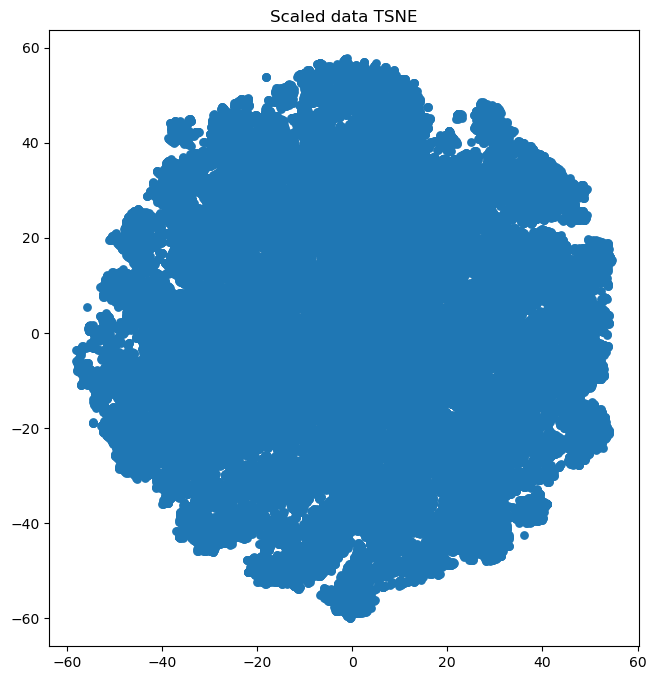

In [51]:
def plot(x, title):
  
    palette = np.array(sns.color_palette("hls", 10))  #Choosing color palette 

    # Create a scatter plot.
    f = plt.figure(figsize=(8, 8))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], lw=0, s=40) # c=palette[colors.astype(np.int)])
    plt.title(title)
    # # Add the labels for each digit.
    # txts = []
    # for i in range(10):
    #     # Position of each label.
    #     xtext, ytext = np.median(x[colors == i, :], axis=0)
    #     txt = ax.text(xtext, ytext, str(i), fontsize=24)
    #     txt.set_path_effects([pe.Stroke(linewidth=5, foreground="w"), pe.Normal()])
    #     txts.append(txt)
    return f, ax #, txts

plot(df_scaled_transform,'Scaled data TSNE')

# Modeling Data

## GMM

In [52]:
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components=7, random_state=0).fit(df_scaled.values)

In [53]:
from cProfile import label

def make_ellipses(gmm, ax):
    colors = ['turquoise', 'orange']
    for n, color in enumerate(colors):
        covariances = gmm.sigma_arr[n]
        v, w = np.linalg.eigh(covariances)
        u = w[0] / np.linalg.norm(w[0])
        angle = np.arctan2(u[1], u[0])
        angle = 180 * angle / np.pi  # convert to degrees
        v = 3. * np.sqrt(2.) * np.sqrt(v)
        mean=gmm.mean_arr[n]
        mean=mean.reshape(2,1)
        print(mean)
        ell = plt.patches.Ellipse(mean, v[0], v[1],
                                  180 + angle, color=color)
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.5)
        ax.add_artist(ell)
        ax.set_aspect('equal', 'datalim')

def plot_2D(gmm,x,col,label):

    h = plt.subplot(111, aspect='equal')
    # make_ellipses(gmm, h)

    plt.scatter(x[:,0],x[:,1],marker='x') # c=label['Species']
    plt.xlim(-10, 10)
    plt.ylim(-10, 10)
    plt.xlabel(col[0])
    plt.ylabel(col[1])
    #plot_cov_ellipse(gmm.sigma_arr[:,:,0],gmm.mean_arr[:,1],ax=ax[0,0])
    plt.show()

def plot_1D(gmm,x,col,num_col):
  plt.hist(x,density=True) #normed=True
  x = np.linspace(x.min(), x.max(), 100, endpoint=False)
  ys = np.zeros_like(x)

  i=0
  for w in gmm.weights_:
      y = stats.multivariate_normal.pdf(x, mean=gmm.means_[i,num_col], cov=gmm.covariances_.diagonal(axis1=1,axis2=2)[i,num_col]) * w

      plt.plot(x, y,label=f'number of clusters: {i+1}')
      ys += y
      i+=1
  
  # print(ys.shape, len(n_cluster))
  plt.xlabel(col)
  plt.plot(x,ys)
  plt.legend()
  plt.show()

In [56]:
df_scaled.head()

,f_22,f_23,f_24,f_25,f_26,f_27,f_28
0,-0.731214,0.923091,-0.686461,0.764373,0.979657,1.078344,0.708546
1,-0.559279,0.458374,1.026695,-0.143294,-0.588816,0.370539,-1.613510
2,2.254911,0.085483,-1.518750,-0.592573,0.999027,-0.944486,-2.244974
3,0.726390,-1.243778,0.820028,-1.186759,-0.428142,-0.111342,0.326289
4,0.210846,-1.513602,0.841697,-0.637332,1.192740,-0.390066,-1.152778


The more distinct the different classes distributions are, the more useful that feature is.

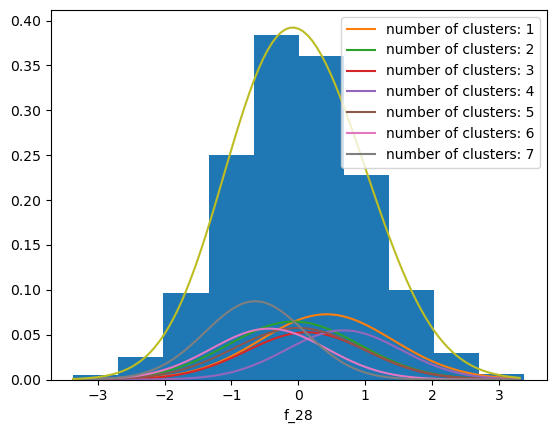

In [169]:
plot_1D(gm,df_scaled['f_28'],'f_28',6)

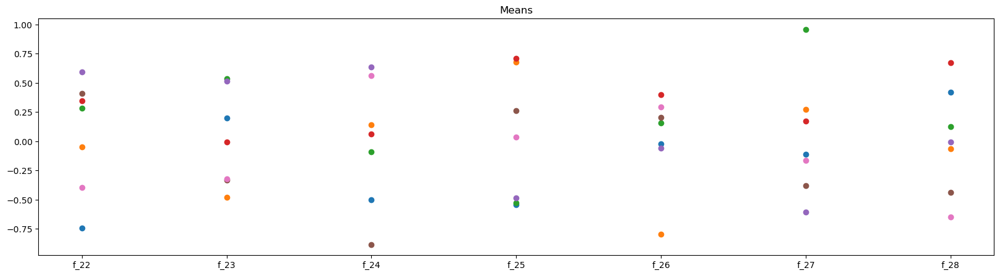

In [64]:
def plot_means(means):
    '''
    Plots the values of the means for each feature.
    '''
    fig, ax = plt.subplots(figsize=(20,5))
    for i in range(means.shape[0]):
        ax.scatter(df_scaled.columns, means[i])
        ax.set_title("Means")
    plt.show()

plot_means(gm.means_)

In [65]:
preds = gm.predict(df_scaled.values)
preds.shape

(84094,)

In [66]:
df_scaled['preds'] = preds
df_scaled.head()

,f_22,f_23,f_24,f_25,f_26,f_27,f_28,preds
0,-0.731214,0.923091,-0.686461,0.764373,0.979657,1.078344,0.708546,3
1,-0.559279,0.458374,1.026695,-0.143294,-0.588816,0.370539,-1.613510,1
2,2.254911,0.085483,-1.518750,-0.592573,0.999027,-0.944486,-2.244974,5
3,0.726390,-1.243778,0.820028,-1.186759,-0.428142,-0.111342,0.326289,4
4,0.210846,-1.513602,0.841697,-0.637332,1.192740,-0.390066,-1.152778,6


Text(0.5, 1.0, 'BIC value fo each cluster')

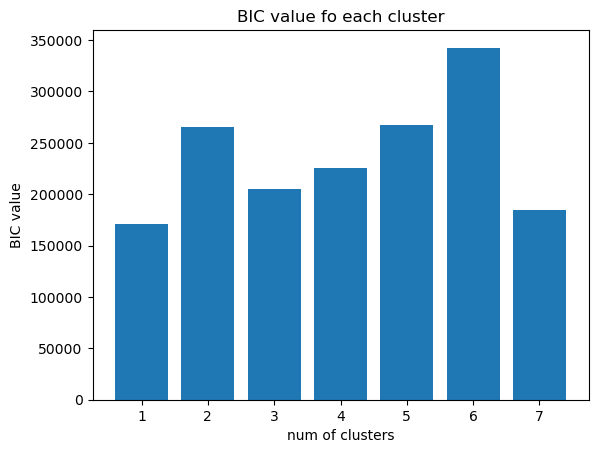

In [67]:
bic_per_cluster = []
for n_cluster in df_scaled.preds.unique():
    bic_per_cluster.append(gm.bic(df_scaled[df_scaled.preds == n_cluster].iloc[:,:-1].values))
plt.bar(x=np.arange(1,len(bic_per_cluster)+1),height=bic_per_cluster)
plt.xlabel('num of clusters')
plt.ylabel('BIC value')
plt.title('BIC value fo each cluster')

(-5.0, 5.0)

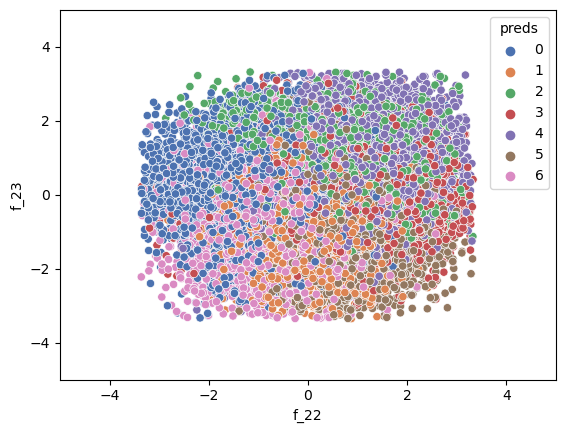

In [68]:
sns.scatterplot(x=df_scaled['f_22'], y=df_scaled['f_23'] ,hue=df_scaled['preds'], palette="deep")
plt.xlim(-5,5)
plt.ylim(-5,5)

In [81]:
## shilouette score before feature selection
from sklearn.metrics import silhouette_score
silhouette_score(df_scaled.iloc[:,:-1],df_scaled.iloc[:,-1], metric='euclidean', sample_size=None, random_state=None)

0.015442894793570567

In [69]:
## shilouette score
from sklearn.metrics import silhouette_score
silhouette_score(df_scaled.iloc[:,:-1],df_scaled.iloc[:,-1], metric='euclidean', sample_size=None, random_state=None)

0.08312241940465981

For n_clusters = 2 The average silhouette_score is : 0.10437858188405498
For n_clusters = 3 The average silhouette_score is : 0.09608616269374497
For n_clusters = 4 The average silhouette_score is : 0.08785336334856286
For n_clusters = 5 The average silhouette_score is : 0.07638465701933801
For n_clusters = 6 The average silhouette_score is : 0.08233908904509891
For n_clusters = 7 The average silhouette_score is : 0.07866429334174213
For n_clusters = 8 The average silhouette_score is : 0.0558433339834466


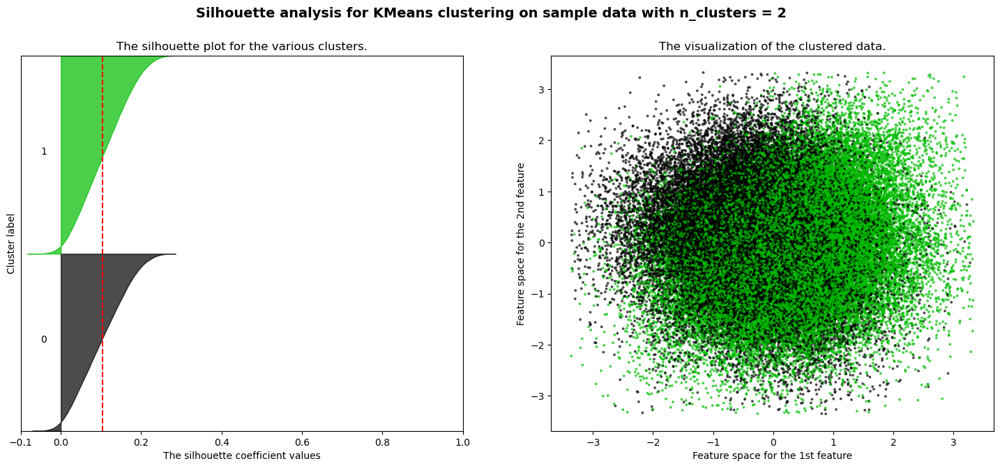

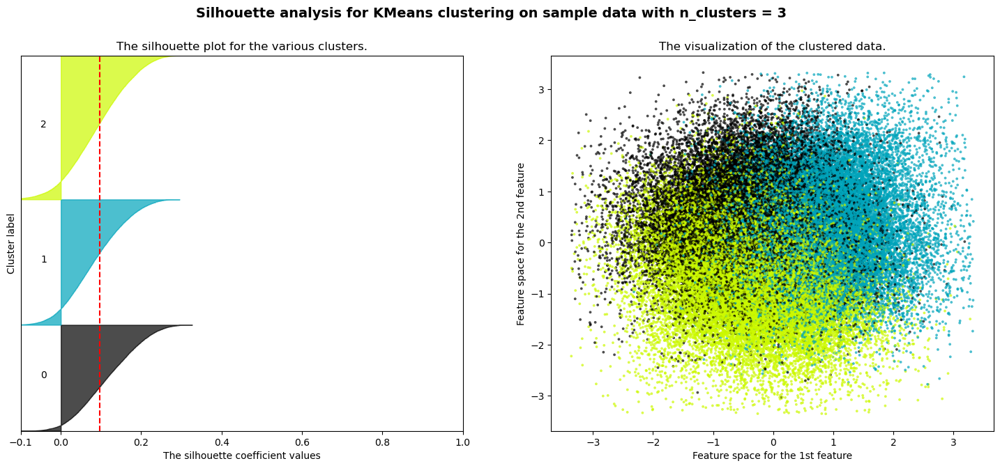

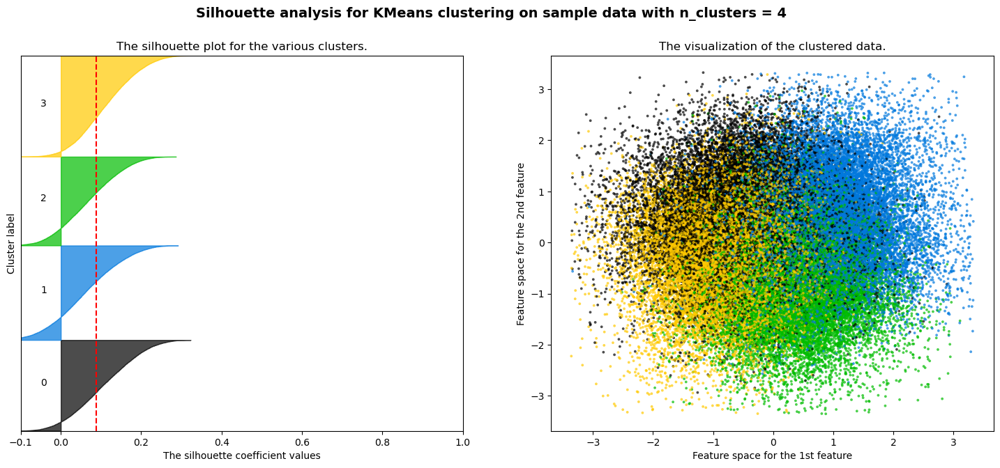

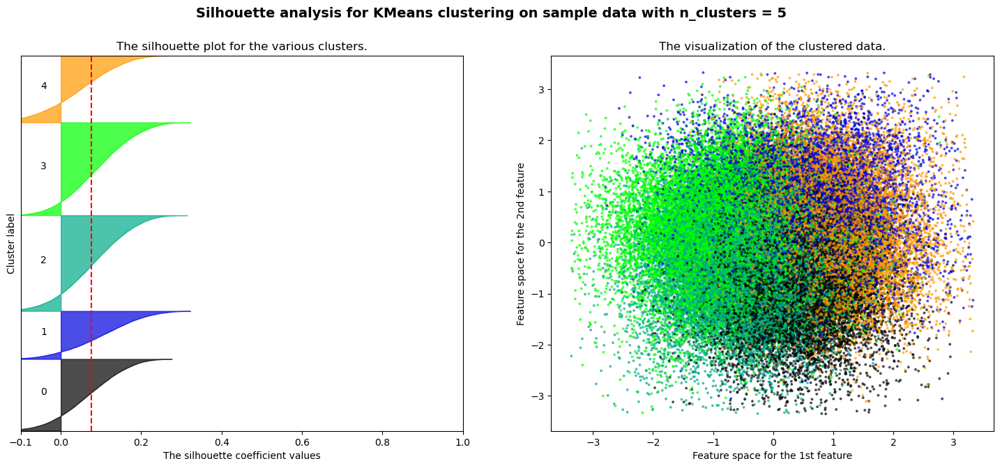

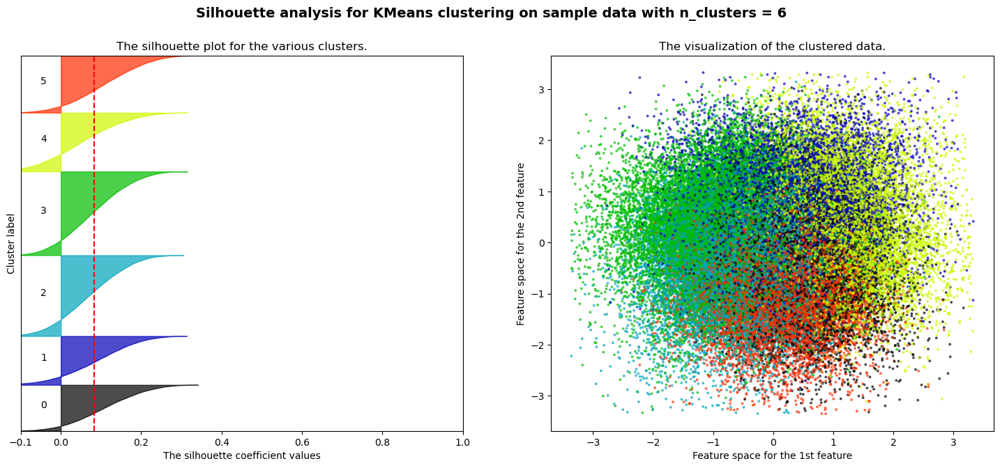

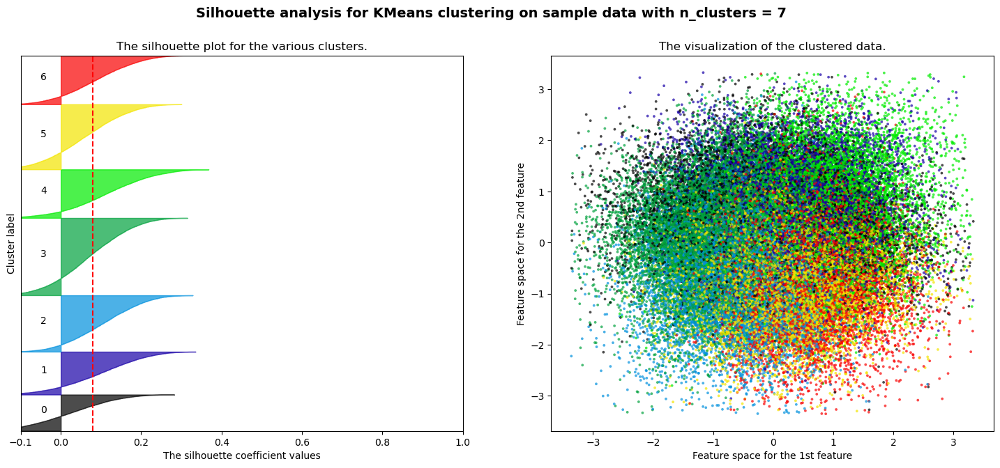

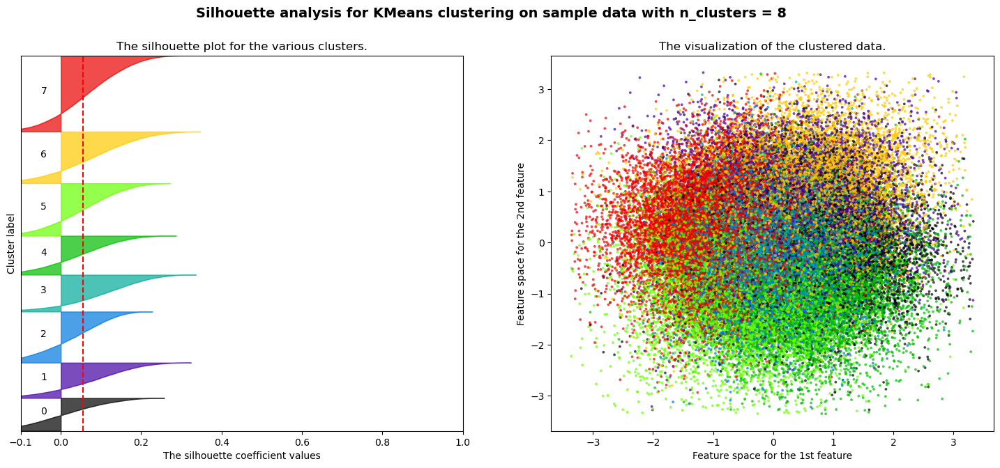

In [70]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_scaled) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = GaussianMixture(n_components=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(df_scaled.iloc[:,:-1])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_scaled.iloc[:,:-1], cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_scaled.iloc[:,:-1], cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        df_scaled.iloc[:, 0], df_scaled.iloc[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # # Labeling the clusters
    # centers = clusterer.cluster_centers_
    # # Draw white circles at cluster centers
    # ax2.scatter(
    #     centers[:, 0],
    #     centers[:, 1],
    #     marker="o",
    #     c="white",
    #     alpha=1,
    #     s=200,
    #     edgecolor="k",
    # )

    # for i, c in enumerate(centers):
    #     ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

## VBGMM

In [71]:
from sklearn import mixture
vgm = mixture.BayesianGaussianMixture(n_components=7)
vgm.fit(df_scaled.iloc[:,:-1])

/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


BayesianGaussianMixture(n_components=7)

In [72]:
preds = vgm.predict(df_scaled.iloc[:,:-1].values)
df_scaled['preds'] = preds
df_scaled.head()

/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but BayesianGaussianMixture was fitted with feature names
  warnings.warn(


,f_22,f_23,f_24,f_25,f_26,f_27,f_28,preds
0,-0.731214,0.923091,-0.686461,0.764373,0.979657,1.078344,0.708546,6
1,-0.559279,0.458374,1.026695,-0.143294,-0.588816,0.370539,-1.613510,5
2,2.254911,0.085483,-1.518750,-0.592573,0.999027,-0.944486,-2.244974,4
3,0.726390,-1.243778,0.820028,-1.186759,-0.428142,-0.111342,0.326289,5
4,0.210846,-1.513602,0.841697,-0.637332,1.192740,-0.390066,-1.152778,5


0.04028877043666631


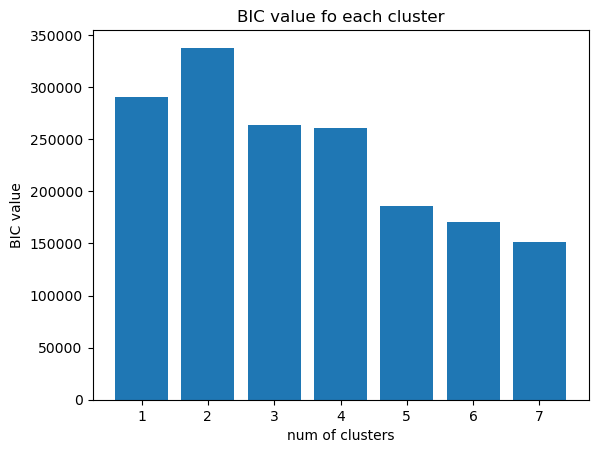

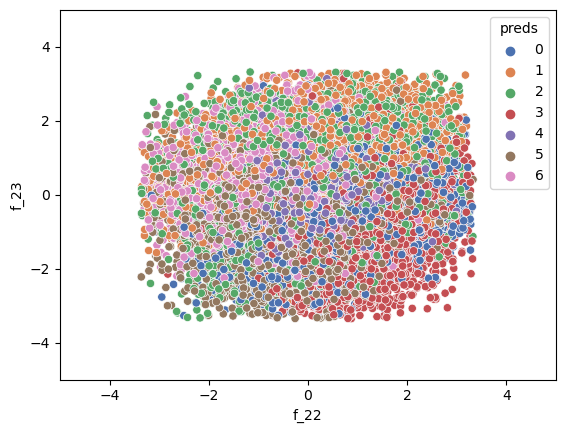

In [73]:
bic_per_cluster = []
for n_cluster in df_scaled.preds.unique():
    bic_per_cluster.append(gm.bic(df_scaled[df_scaled.preds == n_cluster].iloc[:,:-1].values))
plt.bar(x=np.arange(1,len(bic_per_cluster)+1),height=bic_per_cluster)
plt.xlabel('num of clusters')
plt.ylabel('BIC value')
plt.title('BIC value fo each cluster')

plt.figure()
sns.scatterplot(x=df_scaled['f_22'], y=df_scaled['f_23'] ,hue=df_scaled['preds'], palette="deep")
plt.xlim(-5,5)
plt.ylim(-5,5)

## shilouette score
from sklearn.metrics import silhouette_score
print(silhouette_score(df_scaled.iloc[:,:-1],df_scaled.iloc[:,-1], metric='euclidean', sample_size=None, random_state=None))

For n_clusters = 2 The average silhouette_score is : 0.03001464505095476


/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


For n_clusters = 3 The average silhouette_score is : 0.0249625013799604


/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


For n_clusters = 4 The average silhouette_score is : 0.02466470707574209
For n_clusters = 5 The average silhouette_score is : 0.019321473198629275


/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


For n_clusters = 6 The average silhouette_score is : 0.016478896103207376


/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/mixture/_base.py:277: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


For n_clusters = 7 The average silhouette_score is : 0.014842393608111243
For n_clusters = 8 The average silhouette_score is : 0.013424026221366228


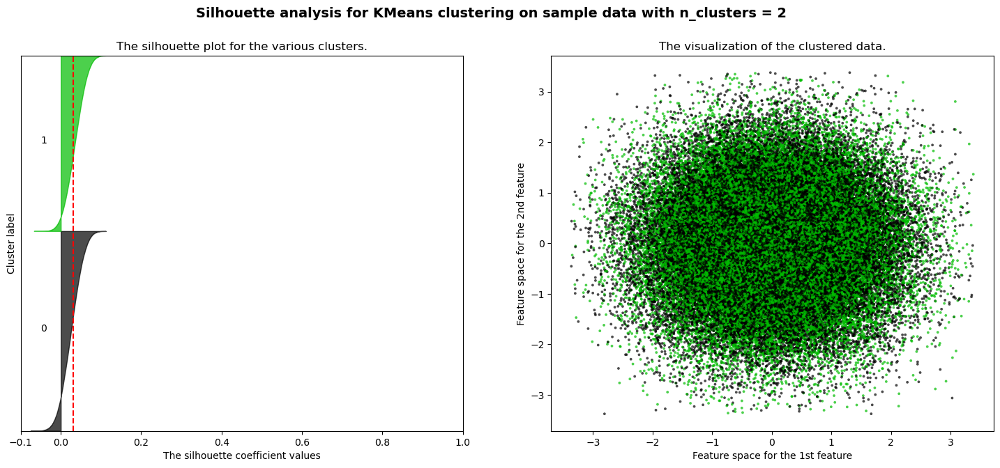

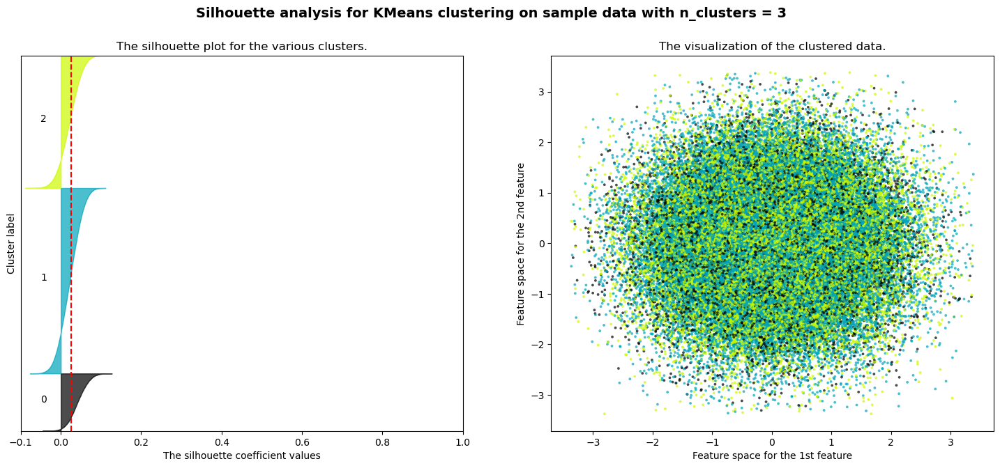

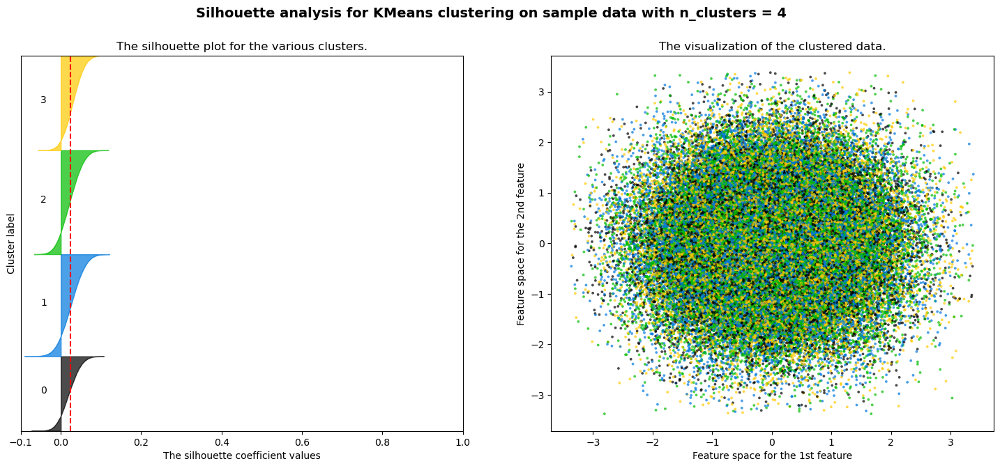

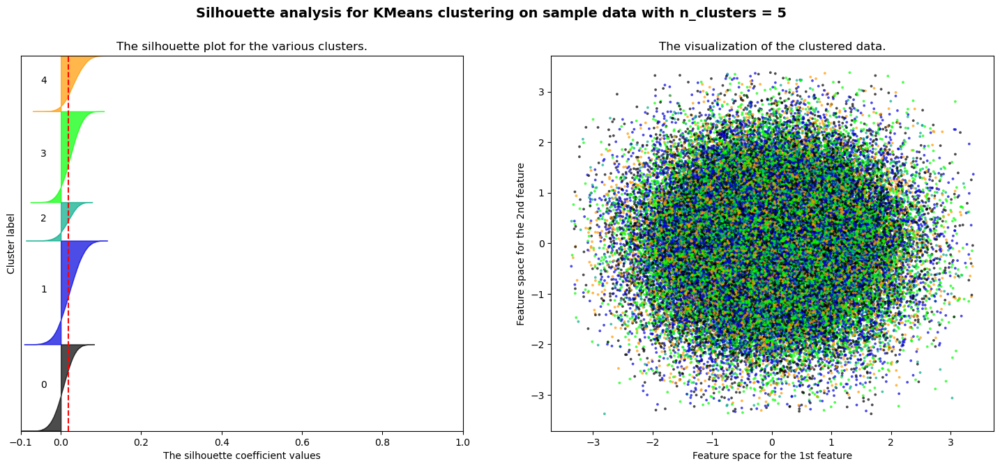

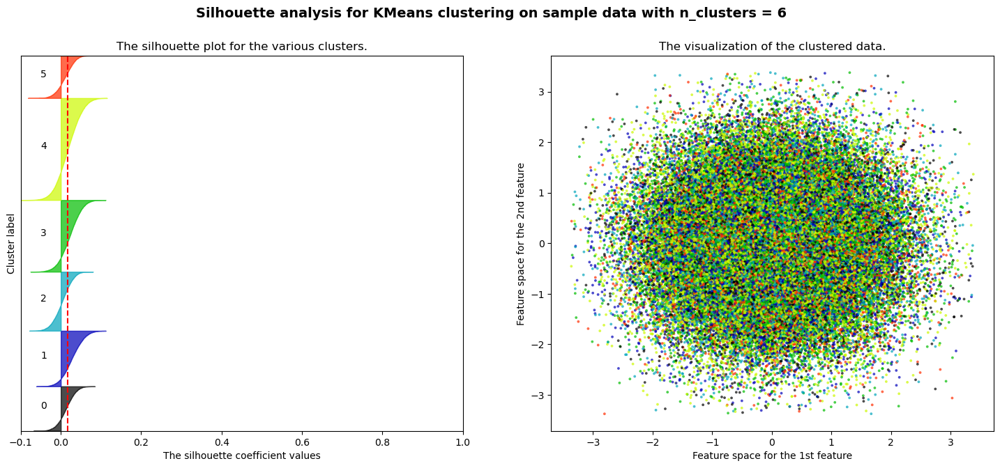

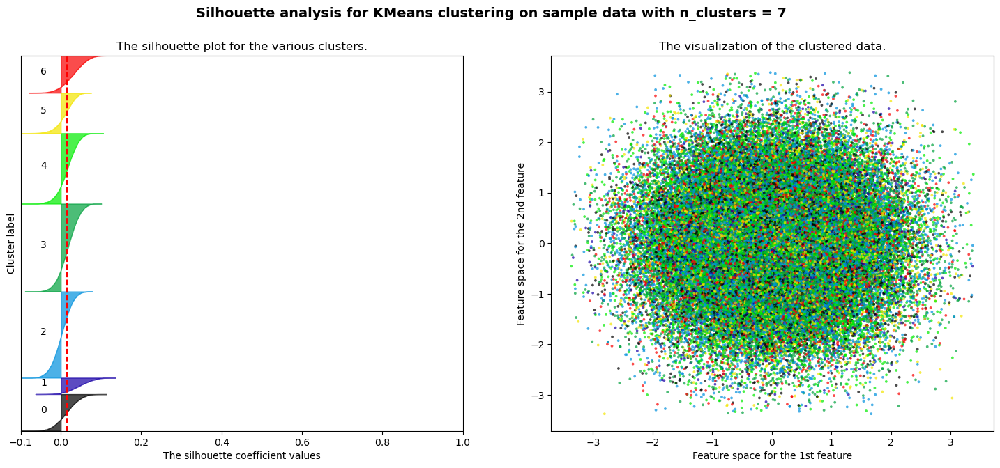

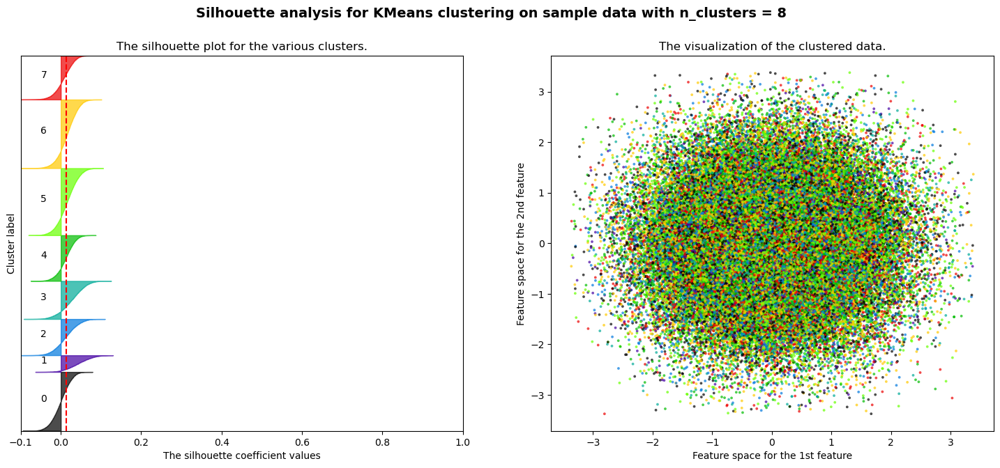

In [96]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_scaled) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = mixture.BayesianGaussianMixture(n_components=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(df_scaled.iloc[:,:-1])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_scaled.iloc[:,:-1], cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_scaled.iloc[:,:-1], cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        df_scaled.iloc[:, 0], df_scaled.iloc[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # # Labeling the clusters
    # centers = clusterer.cluster_centers_
    # # Draw white circles at cluster centers
    # ax2.scatter(
    #     centers[:, 0],
    #     centers[:, 1],
    #     marker="o",
    #     c="white",
    #     alpha=1,
    #     s=200,
    #     edgecolor="k",
    # )

    # for i, c in enumerate(centers):
    #     ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

## K-Means

In [74]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist


distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 20)
  
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k, init='k-means++', random_state=42).fit(df_scaled.iloc[:,:-1])
  
    distortions.append(sum(np.min(cdist(df_scaled.iloc[:,:-1], kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / df_scaled.shape[0])
    inertias.append(kmeanModel.inertia_)
  
    mapping1[k] = sum(np.min(cdist(df_scaled.iloc[:,:-1], kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / df_scaled.shape[0]
    mapping2[k] = kmeanModel.inertia_

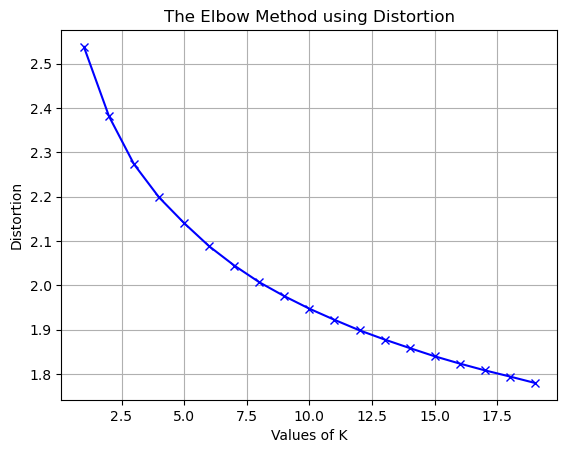

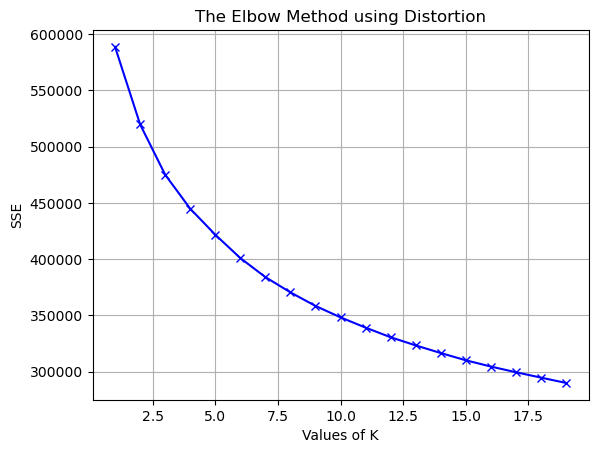

In [76]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.grid()
plt.show()

plt.figure()
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('SSE')
plt.title('The Elbow Method using Distortion')
plt.grid()
plt.show()

/opt/anaconda3/envs/nikos_core/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


0.10607020468620684


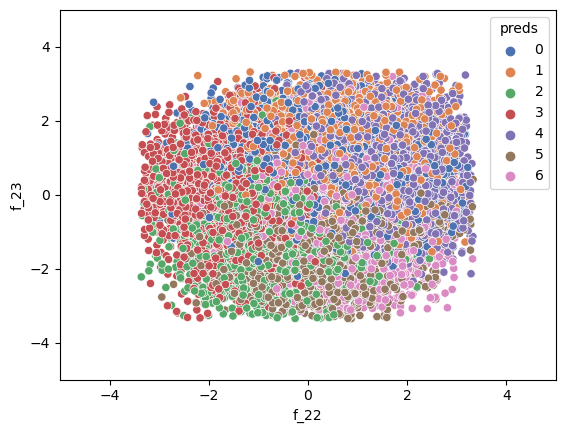

In [77]:
kmeans = KMeans(n_clusters=7, init='k-means++', random_state=42).fit(df_scaled.iloc[:,:-1])

preds = kmeans.predict(df_scaled.iloc[:,:-1].values)
df_scaled['preds'] = preds
df_scaled.head()


plt.figure()
sns.scatterplot(x=df_scaled['f_22'], y=df_scaled['f_23'] ,hue=df_scaled['preds'], palette="deep")
plt.xlim(-5,5)
plt.ylim(-5,5)

## shilouette score
from sklearn.metrics import silhouette_score
print(silhouette_score(df_scaled.iloc[:,:-1],df_scaled.iloc[:,-1], metric='euclidean', sample_size=None, random_state=None))

### GMM with initialization of means and coviances in each process

In [78]:
df_scaled.head()

,f_22,f_23,f_24,f_25,f_26,f_27,f_28,preds
0,-0.731214,0.923091,-0.686461,0.764373,0.979657,1.078344,0.708546,0
1,-0.559279,0.458374,1.026695,-0.143294,-0.588816,0.370539,-1.613510,2
2,2.254911,0.085483,-1.518750,-0.592573,0.999027,-0.944486,-2.244974,6
3,0.726390,-1.243778,0.820028,-1.186759,-0.428142,-0.111342,0.326289,4
4,0.210846,-1.513602,0.841697,-0.637332,1.192740,-0.390066,-1.152778,2


In [127]:
from tqdm import tqdm
import random

randoms = random.sample(range(1, 100),50)

gmm = GaussianMixture(n_components=7, random_state=42, n_init=1, max_iter=200)
gmm.fit(df_scaled.iloc[:,:-1].values)

predictions = []

for r in tqdm(randoms):
    gmm = GaussianMixture(n_components=7,
                            random_state=r,
                            n_init=1,
                            max_iter=200,
                            init_params='k-means++')

    gmm.fit(df_scaled.iloc[:,:-1].values)

    predictions.append(gmm.means_)
    precisions_total.append(gmm.precisions_)
    weights_total.append(gmm.weights_)


100%|██████████| 10/10 [00:05<00:00,  1.90it/s]


In [142]:
means_final = (means_total[0] + means_total[1] + means_total[2] + means_total[3] + means_total[4] + means_total[5] + means_total[6] +means_total[7]) / 7

In [143]:
weights_final = (weights_total[0] + weights_total[1] + weights_total[2] + weights_total[3] + weights_total[4] + weights_total[5] + weights_total[6] +weights_total[7]) / 7

In [147]:
precisions_final = (precisions_total[0] + precisions_total[1] + precisions_total[2] + precisions_total[3] + precisions_total[4] + precisions_total[5] + precisions_total[6] +precisions_total[7]) / 7

In [150]:
gmm = GaussianMixture(n_components=7,
                            random_state=42,
                            n_init=1,
                            max_iter=200,
                            weights_init =weights_final / np.sum(weights_final),
                            means_init=means_final,
                            precisions_init=precisions_final)

gmm.fit(df_scaled.iloc[:,:-1].values)

GaussianMixture(max_iter=200,
                means_init=array([[-0.11945781,  0.38852888, -0.16079695,  0.57442365,  0.5221528 ,
        -0.01713956,  1.0949347 ],
       [ 0.3001122 ,  0.47938133, -0.14302415, -0.63552482,  0.12490292,
         0.92859406, -0.00511928],
       [-0.38271037, -0.47504209,  0.5939232 ,  0.16575442,  0.35221068,
        -0.185259  , -0.72454746],
       [-0.73066482,  0.14012202, -0.41364989, -0.61236202, -0.12348922,
        -0...
        [-0.26668504, -0.23012015, -0.11239946, -0.31777602,
          1.55118429, -0.3524706 ,  0.69307965],
        [ 0.17792862,  0.07038517, -0.08397294,  0.085901  ,
         -0.3524706 ,  1.30022839, -0.35281408],
        [ 0.10066237,  0.18200591, -0.12694891, -0.22507008,
          0.69307965, -0.35281408,  1.84252147]]]),
                random_state=42,
                weights_init=array([0.11117978, 0.12027473, 0.15464931, 0.18444537, 0.13631384,
       0.16525967, 0.1278773 ]))

In [151]:
preds = gmm.predict(df_scaled.iloc[:,:-1].values)
df_scaled['preds'] = preds
df_scaled.head()

,f_22,f_23,f_24,f_25,f_26,f_27,f_28,preds
0,-0.731214,0.923091,-0.686461,0.764373,0.979657,1.078344,0.708546,0
1,-0.559279,0.458374,1.026695,-0.143294,-0.588816,0.370539,-1.613510,5
2,2.254911,0.085483,-1.518750,-0.592573,0.999027,-0.944486,-2.244974,6
3,0.726390,-1.243778,0.820028,-1.186759,-0.428142,-0.111342,0.326289,1
4,0.210846,-1.513602,0.841697,-0.637332,1.192740,-0.390066,-1.152778,2


0.07205969742427026


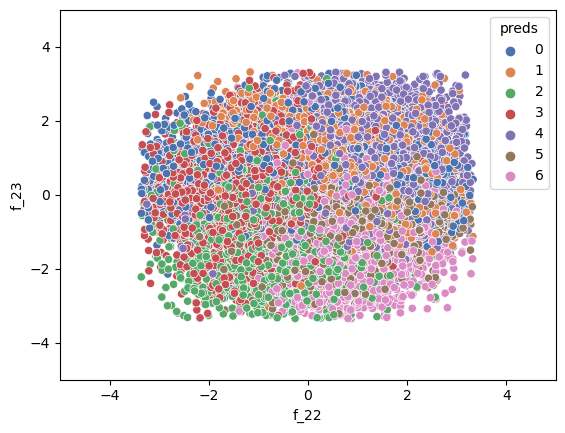

In [152]:
plt.figure()
sns.scatterplot(x=df_scaled['f_22'], y=df_scaled['f_23'] ,hue=df_scaled['preds'], palette="deep")
plt.xlim(-5,5)
plt.ylim(-5,5)

## shilouette score
from sklearn.metrics import silhouette_score
print(silhouette_score(df_scaled.iloc[:,:-1],df_scaled.iloc[:,-1], metric='euclidean', sample_size=None, random_state=None))